In [1]:
# create offset

# load a latent

# apply offset

# plot it

In [1]:
# import what we need
%matplotlib inline
import argparse
import math
import os

import torch
import ninja
from torch import optim
from torch.nn import functional as F
from torchvision import transforms
from PIL import Image
from tqdm import tqdm
import IPython.display
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import pickle
import cv2

from model import Generator

In [2]:
# helper functions
def make_image(tensor):
    return (
        tensor.detach()
        .clamp_(min=-1, max=1)
        .add(1)
        .div_(2)
        .mul(255)
        .type(torch.uint8)
        .permute(0, 2, 3, 1)
        .to("cpu")
        .numpy()
    )

In [3]:
# load the model

model_checkpoint = "/afs/csail.mit.edu/u/v/vmreyes/models/movie512.pt"
ckpt_channel_multiplier = 1
generator_dim = 512
device = "cuda"
frame_width = 1600
frame_height = 800


g_ema = Generator(generator_dim, 512, 8, channel_multiplier=ckpt_channel_multiplier)
g_ema.load_state_dict(torch.load(model_checkpoint)["g_ema"], strict=False)
g_ema.eval()
g_ema = g_ema.to(device)
noises_single = g_ema.make_noise()
noises = []
for noise in noises_single:
    noises.append(noise.repeat(1, 1, 1, 1).normal_())

In [62]:
# load latents z1 and zWindow
frame_num = "00275"
target_latents = "/data/vision/torralba/scratch/vmreyes/" + \
                "interpolated-loss/lw-running-10/latents/" + \
                "lw-" + frame_num + "-15000-steps.pt"

projected_result = torch.load(target_latents)
print(projected_result.keys())
frame_key = 'scenes/little_women/frames/running_interpolate10/lw-' + frame_num + '.png'
print(projected_result[frame_key].keys())
z_1 = projected_result[frame_key]['latent1']
z_1.requires_grad = False
z_window = projected_result[frame_key]['latent2']
z_window.requires_grad = False

noise = projected_result[frame_key]['noise'] # TODO(vmreyes): noise is being saved as a 0,1,X,X dim tensor
img = projected_result[frame_key]['img']

dict_keys(['scenes/little_women/frames/running_interpolate10/lw-00275.png'])
dict_keys(['img', 'latent1', 'latent2', 'noise'])


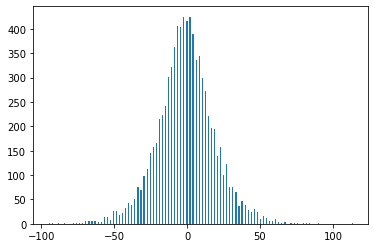

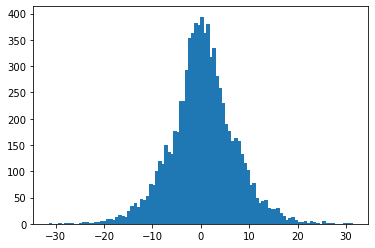

In [45]:
def print_histogram_of_latent(latent, bins=100):
    calculated_hist = torch.histc(latent, bins=bins)
    x_axis = np.arange(latent.min().cpu(), latent.max().cpu(), (latent.max().cpu() - latent.min().cpu()) / bins)
    plt.bar(x_axis, calculated_hist.cpu())
    plt.show()
print_histogram_of_latent(z_1, 100)
print_histogram_of_latent(z_window, 100)

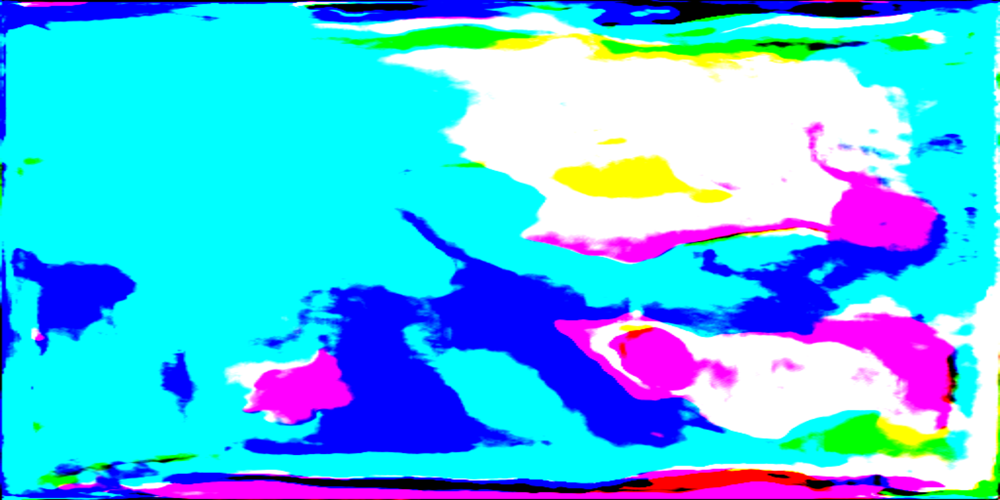

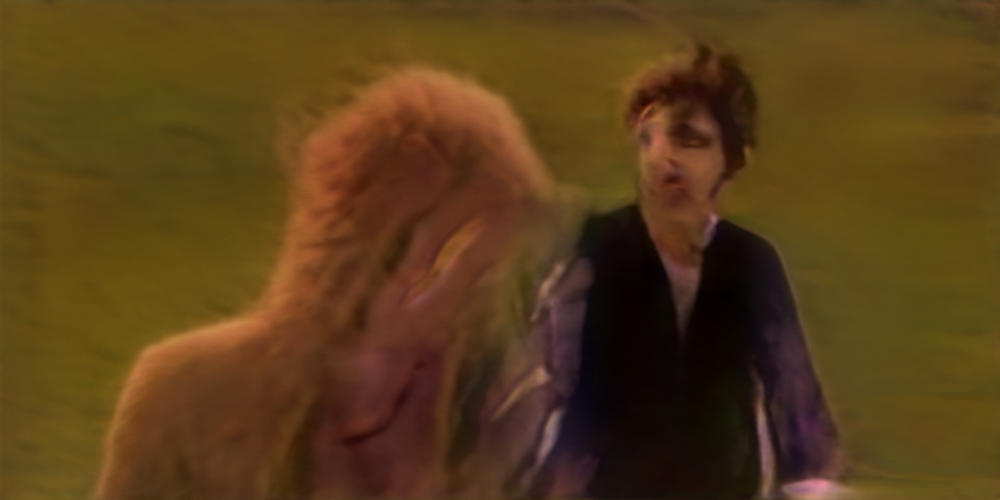

In [46]:
# show z_1 and z_window
orig_img_gen, _ = g_ema(z_1[None, None,:], input_is_latent=True, noise=noises)
original_img_ar = make_image(orig_img_gen)[0]
original_img = Image.fromarray(original_img_ar).resize((frame_width,frame_height))
IPython.display.display(original_img)

orig_img_gen, _ = g_ema(z_window[None, None,:], input_is_latent=True, noise=noises)
original_img_ar = make_image(orig_img_gen)[0]
original_img = Image.fromarray(original_img_ar).resize((frame_width,frame_height))
IPython.display.display(original_img)


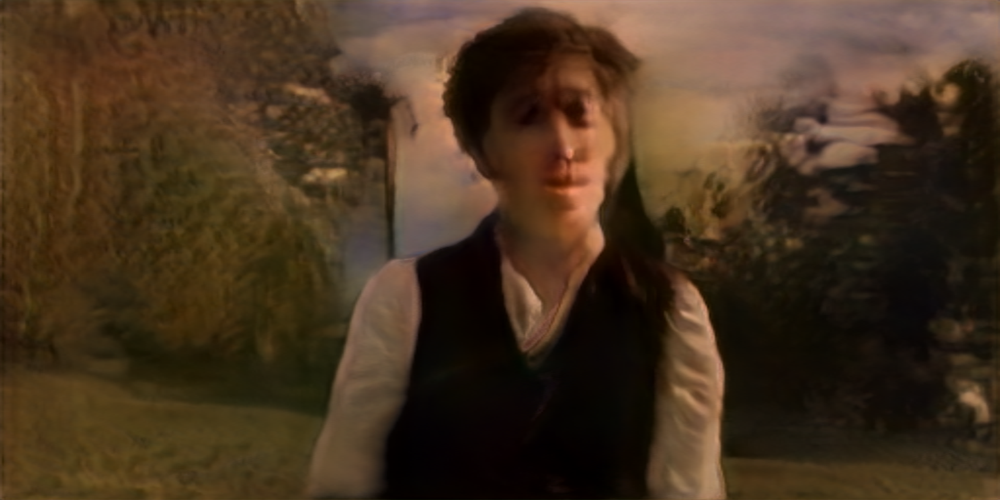

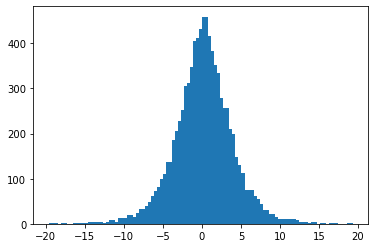

In [106]:
# style transfer

#layer 2 (1 0-indexed) seems to contain alot of positional information.
#resetting layers 2 to 6 almost convincingly moves the subject matter.
from_layer =0
to_layer =3

altered_latent = latent.detach().clone()
for i in range(from_layer, to_layer+1):
    altered_latent[i] = opp_latent[i].detach().clone()

print_histogram_of_latent(altered_latent, 100)
    
img_gen, _ = g_ema(altered_latent[None, None,:], input_is_latent=True, noise=noises)
img_ar = make_image(img_gen)[0]
new_img = Image.fromarray(img_ar).resize((frame_width,frame_height))
IPython.display.display(new_img)

0.0
0.034482758620689655
0.06896551724137931
0.10344827586206896
0.13793103448275862
0.1724137931034483
0.20689655172413793
0.2413793103448276
0.27586206896551724
0.3103448275862069
0.3448275862068966
0.3793103448275862
0.41379310344827586
0.4482758620689655
0.4827586206896552
0.5172413793103449
0.5517241379310345
0.5862068965517241
0.6206896551724138
0.6551724137931034
0.6896551724137931
0.7241379310344828
0.7586206896551724
0.7931034482758621
0.8275862068965517
0.8620689655172413
0.896551724137931
0.9310344827586207
0.9655172413793104
1.0


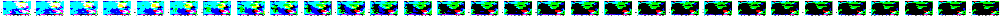

In [53]:
# change exaggerator
delta_latent = z_1 - z_window

_, axes = plt.subplots(1,30, figsize=(200,100))
for i in range(30):
    new_latent = z_1 + i * 1/(30-1) * delta_latent
    print(i * 1/(30-1))
    #print(new_latent[0])
    img_gen, _ = g_ema(new_latent[None, None,:], input_is_latent=True, noise=noises)
    img_ar = make_image(img_gen)[0]
    #Image.fromarray(img_ar).resize((frame_width,frame_height)).save(str(i)+'.png')
    new_img = np.asarray(Image.fromarray(img_ar).resize((frame_width,frame_height)))
   # imshow(new_img)
    axes[i].imshow(new_img)

dict_keys(['lpips', 'latents'])


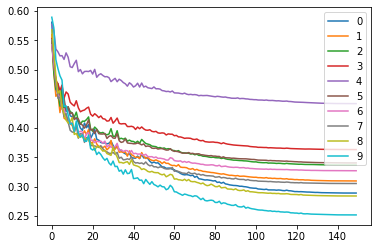

CalledProcessError: Command '['ffmpeg', '-f', 'rawvideo', '-vcodec', 'rawvideo', '-s', '720x432', '-pix_fmt', 'rgba', '-r', '5.0', '-loglevel', 'error', '-i', 'pipe:', '-vcodec', 'h264', '-pix_fmt', 'yuv420p', '-y', '/tmp/tmp992a53_k/temp.m4v']' returned non-zero exit status 255.

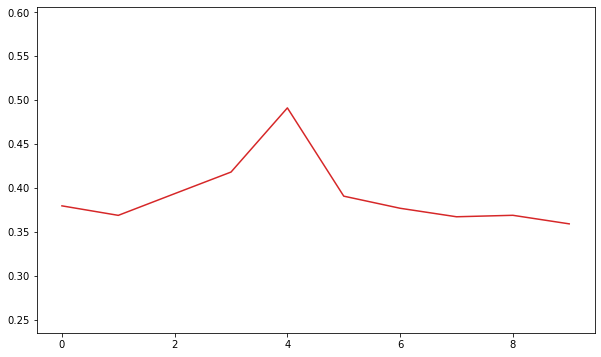

In [39]:
# look at lpips over time
data_filename = "/data/vision/torralba/scratch/vmreyes/" + \
                "interpolated-loss/lw-running-10/video2/" + \
                "lpips" + "-15000-steps.data"
with open(data_filename, 'rb') as datafile:
    data = pickle.load(datafile)

lpips = np.array(data['lpips'])
for i in range(len(lpips[0])):
    plt.plot(lpips[:,i], label=str(i))
plt.legend()
plt.show()

#plot a slice of the lpips graph
from celluloid import Camera
from IPython.display import HTML

#plot a slice of the lpips graph

fig, ax = plt.subplots(figsize=(10,6))
camera = Camera(fig)

for series_data in lpips:
    ax.plot(series_data)
    camera.snap()

animation = camera.animate()
HTML(animation.to_html5_video())

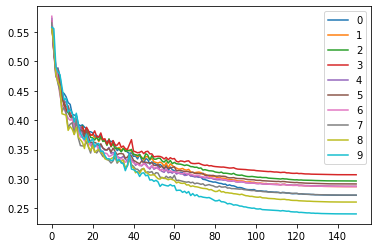

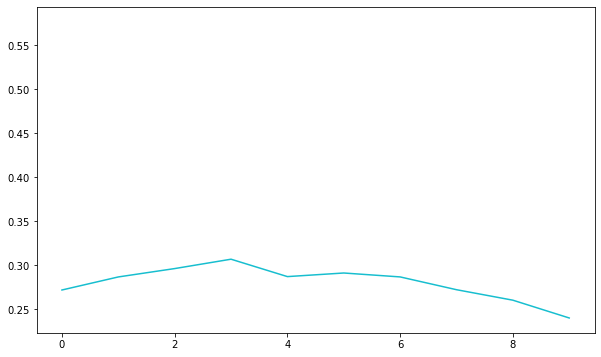

In [37]:
# look at lpips over time
data_filename = "/data/vision/torralba/scratch/vmreyes/" + \
                "interpolated-loss/lw-running-10/video3/" + \
                "lpips" + "-15000-steps.data"
with open(data_filename, 'rb') as datafile:
    data = pickle.load(datafile)
    
lpips = np.array(data['lpips'])
for i in range(len(lpips[0])):
    plt.plot(lpips[:,i], label=str(i))
plt.legend()
plt.show()

#plot a slice of the lpips graph
from celluloid import Camera
from IPython.display import HTML

#plot a slice of the lpips graph

fig, ax = plt.subplots(figsize=(10,6))
camera = Camera(fig)

for series_data in lpips:
    ax.plot(series_data)
    camera.snap()

animation = camera.animate()
HTML(animation.to_html5_video())

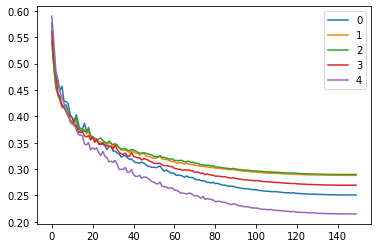

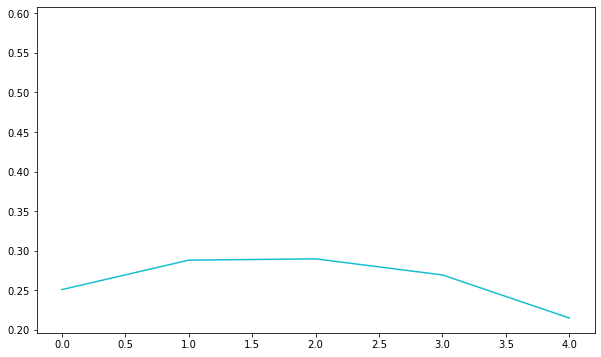

In [29]:
# look at lpips over time
data_filename = "/data/vision/torralba/scratch/vmreyes/" + \
                "interpolated-loss/lw-running-5/video/" + \
                "lpips" + "-15000-steps.data"
with open(data_filename, 'rb') as datafile:
    data = pickle.load(datafile)
    
lpips = np.array(data['lpips'])
for i in range(len(lpips[0])):
    plt.plot(lpips[:,i], label=str(i))
plt.legend()
plt.show()

#plot a slice of the lpips graph
from celluloid import Camera
from IPython.display import HTML

#plot a slice of the lpips graph

fig, ax = plt.subplots(figsize=(10,6))
camera = Camera(fig)

for series_data in lpips:
    ax.plot(series_data)
    camera.snap()

animation = camera.animate()
HTML(animation.to_html5_video())

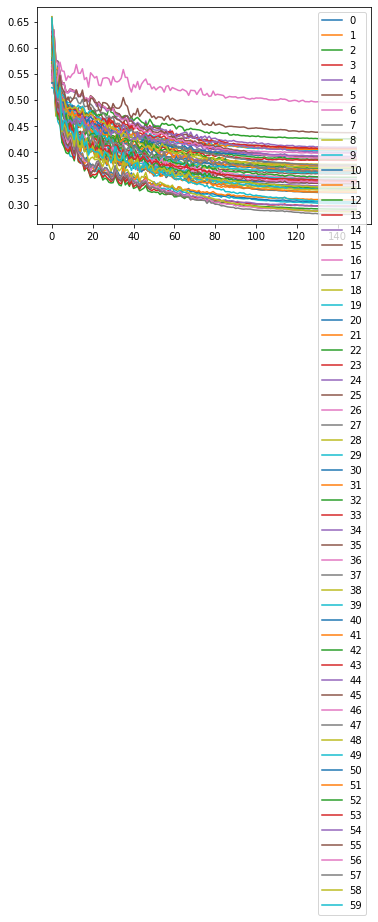

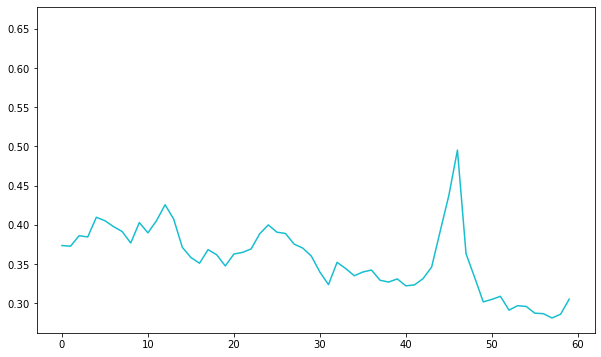

In [48]:
# look at lpips over time
data_filename = "/data/vision/torralba/scratch/vmreyes/" + \
                "interpolated-loss/lw-running-60/video/" + \
                "lpips" + "-15000-steps.data"
with open(data_filename, 'rb') as datafile:
    data = pickle.load(datafile)
    
lpips = np.array(data['lpips'])
for i in range(len(lpips[0])):
    plt.plot(lpips[:,i], label=str(i))
plt.legend()
plt.show()


from celluloid import Camera
from IPython.display import HTML

#plot a slice of the lpips graph

fig, ax = plt.subplots(figsize=(10,6))
camera = Camera(fig)

for series_data in lpips:
    ax.plot(series_data)
    camera.snap()

animation = camera.animate()
HTML(animation.to_html5_video())

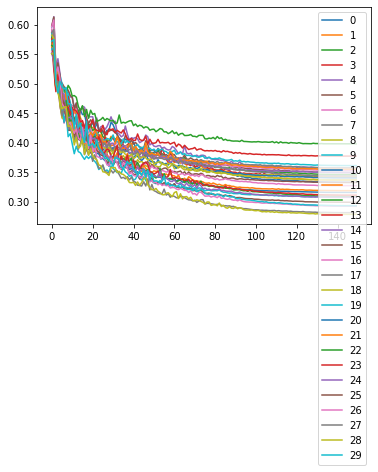

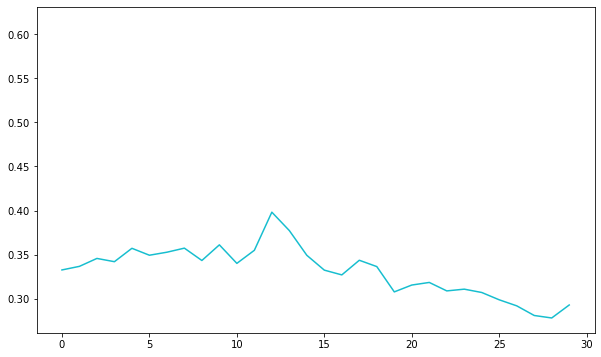

In [47]:
# look at lpips over time
data_filename = "/data/vision/torralba/scratch/vmreyes/" + \
                "interpolated-loss/lw-running-30/video4/" + \
                "lpips" + "-15000-steps.data"
with open(data_filename, 'rb') as datafile:
    data = pickle.load(datafile)
    
lpips = np.array(data['lpips'])
for i in range(len(lpips[0])):
    plt.plot(lpips[:,i], label=str(i))
plt.legend()
plt.show()


from celluloid import Camera
from IPython.display import HTML

#plot a slice of the lpips graph

fig, ax = plt.subplots(figsize=(10,6))
camera = Camera(fig)

for series_data in lpips:
    ax.plot(series_data)[:10]
    camera.snap()

animation = camera.animate()
HTML(animation.to_html5_video())

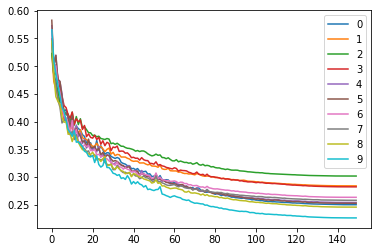

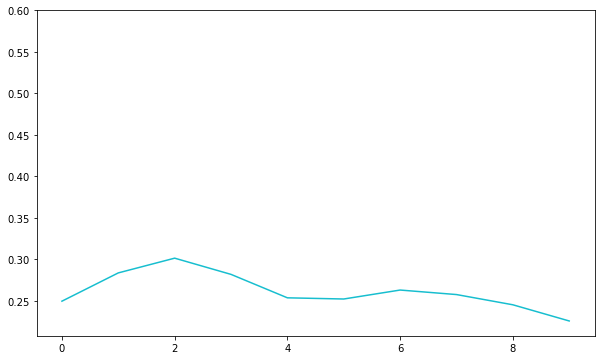

In [44]:
# look at lpips over time
data_filename = "/data/vision/torralba/scratch/vmreyes/" + \
                "interpolated-loss/lw-running-10-quadratic/video/" + \
                "lpips" + "-15000-steps.data"
with open(data_filename, 'rb') as datafile:
    data = pickle.load(datafile)
    
lpips = np.array(data['lpips'])
for i in range(len(lpips[0])):
    plt.plot(lpips[:,i], label=str(i))
plt.legend()
plt.show()


from celluloid import Camera
from IPython.display import HTML

#plot a slice of the lpips graph

fig, ax = plt.subplots(figsize=(10,6))
camera = Camera(fig)

for series_data in lpips:
    ax.plot(series_data)
    camera.snap()

animation = camera.animate()
HTML(animation.to_html5_video())

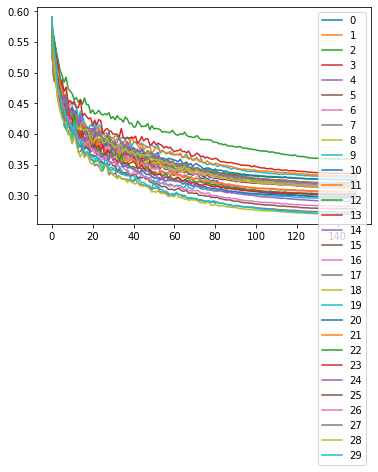

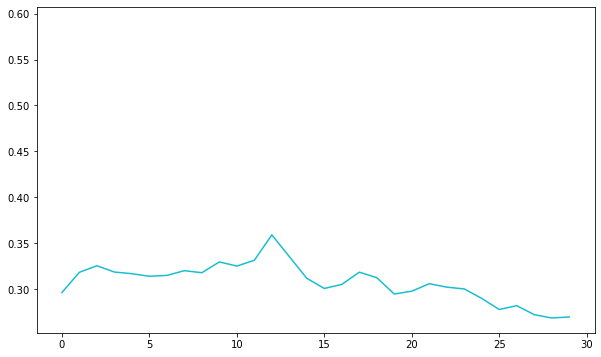

In [49]:
# look at lpips over time
data_filename = "/data/vision/torralba/scratch/vmreyes/" + \
                "interpolated-loss/lw-running-30-quadratic/video/" + \
                "lpips" + "-15000-steps.data"
with open(data_filename, 'rb') as datafile:
    data = pickle.load(datafile)
    
lpips = np.array(data['lpips'])
for i in range(len(lpips[0])):
    plt.plot(lpips[:,i], label=str(i))
plt.legend()
plt.show()


from celluloid import Camera
from IPython.display import HTML

#plot a slice of the lpips graph

fig, ax = plt.subplots(figsize=(10,6))
camera = Camera(fig)

for series_data in lpips:
    ax.plot(series_data)
    camera.snap()

animation = camera.animate()
HTML(animation.to_html5_video())

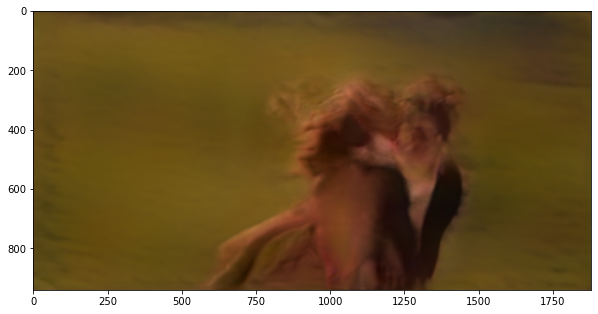

In [46]:
# create animation for the progression of a certain frame through iterations time.
from celluloid import Camera
from IPython.display import HTML


data_filename = "/data/vision/torralba/scratch/vmreyes/" + \
                "interpolated-loss/lw-running-30/video4/" + \
                "lpips" + "-15000-steps.data"
with open(data_filename, 'rb') as datafile:
    data = pickle.load(datafile)

latents = data['latents']

frame_width = 1880
frame_height = 940
TARGET_FRAME = 0

fig, ax = plt.subplots(figsize=(10,6))
camera = Camera(fig)

for i in range(150):
    latent = latents[i][TARGET_FRAME]
    #new_latent = z_1 + i * 1/(30-1) * delta_latent
    #print(i * 1/(30-1))
    #print(new_latent[0])
    img_gen, _ = g_ema([latent], input_is_latent=True, noise=noises)
    img_ar = make_image(img_gen)[0]
    ax.imshow(cv2.resize(img_ar, (frame_width, frame_height)))
    camera.snap()
    #Image.fromarray(img_ar).resize((frame_width,frame_height)).save(f'last-frame-iteration-progression-{i:03}.png')
    #new_img = np.asarray(Image.fromarray(img_ar).resize((frame_width,frame_height)))
   # imshow(new_img)
    #axes[i].imshow(new_img)
animation = camera.animate()
HTML(animation.to_html5_video())

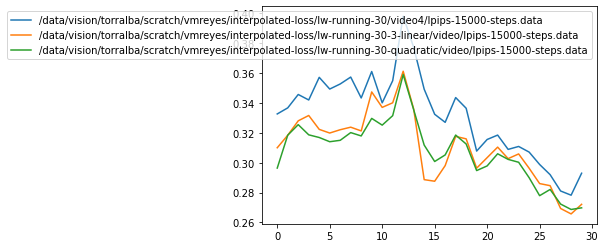

In [56]:
# compare lpips between methods
# look at lpips over time
# data_filename1 = "/data/vision/torralba/scratch/vmreyes/" + \
#                 "interpolated-loss/lw-running-30-alpha-comparison/video/" + \
#                 "lpips" + "-5000-steps.data"
data_filename2 = "/data/vision/torralba/scratch/vmreyes/" + \
                "interpolated-loss/lw-running-30/video4/" + \
                "lpips" + "-15000-steps.data"
data_filename3 = "/data/vision/torralba/scratch/vmreyes/" + \
                "interpolated-loss/lw-running-30-3-linear/video/" + \
                "lpips" + "-15000-steps.data"
data_filename4 = "/data/vision/torralba/scratch/vmreyes/" + \
                "interpolated-loss/lw-running-30-quadratic/video/" + \
                "lpips" + "-15000-steps.data"
for filename in [data_filename2, data_filename3, data_filename4]:
    with open(filename, 'rb') as datafile:
        data = pickle.load(datafile)
        lpips = np.array(data['lpips'])
        plt.plot(lpips[-1], label=filename)
plt.legend()
plt.show()

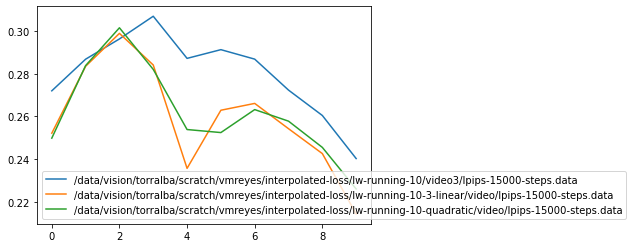

In [58]:
# compare lpips between methods
# look at lpips over time
# data_filename1 = "/data/vision/torralba/scratch/vmreyes/" + \
#                 "interpolated-loss/lw-running-30-alpha-comparison/video/" + \
#                 "lpips" + "-5000-steps.data"
data_filename2 = "/data/vision/torralba/scratch/vmreyes/" + \
                "interpolated-loss/lw-running-10/video3/" + \
                "lpips" + "-15000-steps.data"
data_filename3 = "/data/vision/torralba/scratch/vmreyes/" + \
                "interpolated-loss/lw-running-10-3-linear/video/" + \
                "lpips" + "-15000-steps.data"
data_filename4 = "/data/vision/torralba/scratch/vmreyes/" + \
                "interpolated-loss/lw-running-10-quadratic/video/" + \
                "lpips" + "-15000-steps.data"
for filename in [data_filename2, data_filename3, data_filename4]:
    with open(filename, 'rb') as datafile:
        data = pickle.load(datafile)
        lpips = np.array(data['lpips'])
        plt.plot(lpips[-1], label=filename)
plt.legend()
plt.show()

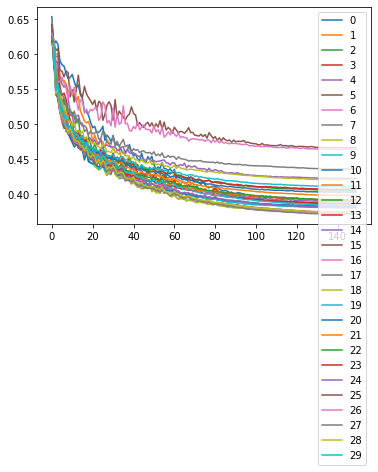

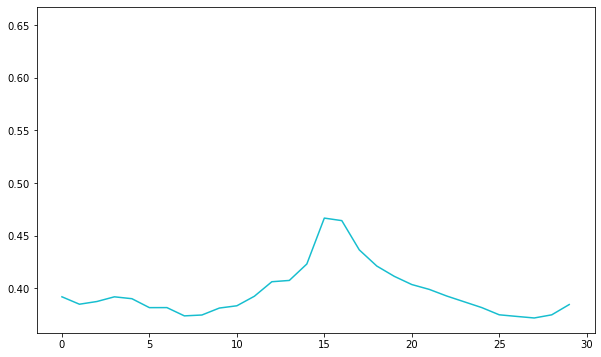

In [60]:
# look at lpips over time
data_filename = "/data/vision/torralba/scratch/vmreyes/" + \
                "interpolated-loss/lor_dialogue/window-30-2-linear/video/" + \
                "window-30-2-linear"+"lpips" + "-15000-steps.data"
with open(data_filename, 'rb') as datafile:
    data = pickle.load(datafile)
    
lpips = np.array(data['lpips'])
for i in range(len(lpips[0])):
    plt.plot(lpips[:,i], label=str(i))
plt.legend()
plt.show()


from celluloid import Camera
from IPython.display import HTML

#plot a slice of the lpips graph

fig, ax = plt.subplots(figsize=(10,6))
camera = Camera(fig)

for series_data in lpips:
    ax.plot(series_data)
    camera.snap()

animation = camera.animate()
HTML(animation.to_html5_video())

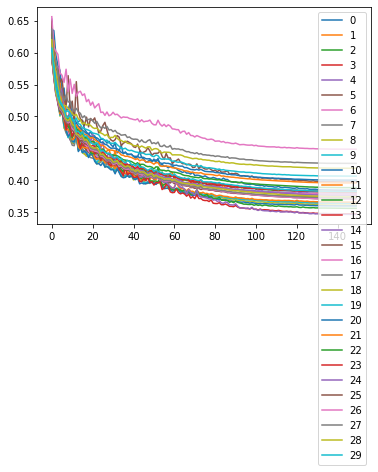

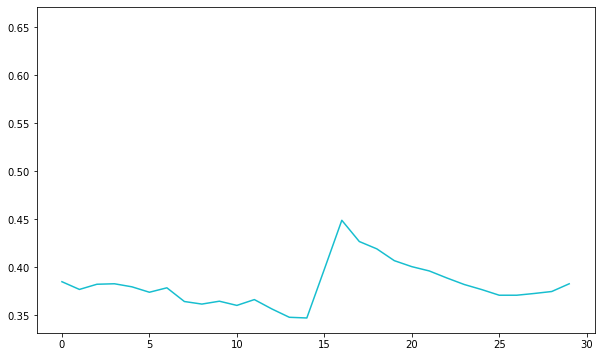

In [62]:
# look at lpips over time
data_filename = "/data/vision/torralba/scratch/vmreyes/" + \
                "interpolated-loss/lor_dialogue/window-30-3-linear/video/" + \
                "window-30-2-linear"+"lpips" + "-15000-steps.data"
with open(data_filename, 'rb') as datafile:
    data = pickle.load(datafile)
    
lpips = np.array(data['lpips'])
for i in range(len(lpips[0])):
    plt.plot(lpips[:,i], label=str(i))
plt.legend()
plt.show()


from celluloid import Camera
from IPython.display import HTML

#plot a slice of the lpips graph

fig, ax = plt.subplots(figsize=(10,6))
camera = Camera(fig)

for series_data in lpips:
    ax.plot(series_data)
    camera.snap()

animation = camera.animate()
HTML(animation.to_html5_video())

dict_keys(['lpips', 'latents'])
29


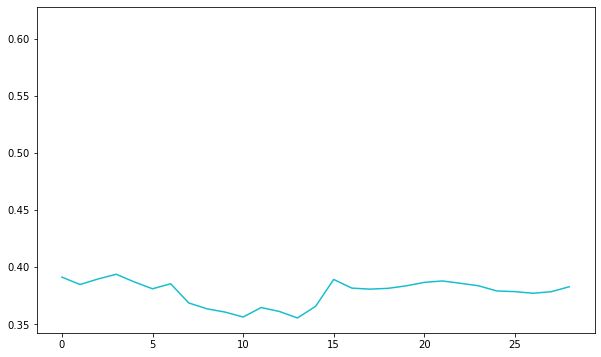

In [19]:
# look at lpips over time
data_filename = "/data/vision/torralba/scratch/vmreyes/" + \
                "interpolated-loss/lor_dialogue/window-30-peak-finding-5000-lpips-fixed/video/" + \
                ""+"lpips" + "-5000-steps.data"
with open(data_filename, 'rb') as datafile:
    data = pickle.load(datafile)

print(data.keys())
lpips = np.array(data['lpips'])
print(len(lpips[0])) # batch size, meaning we arent storing lpips for the whole slice
# for i in range(len(lpips[0])):
#     plt.plot(lpips[:,i], label=str(i))
# plt.legend()
# plt.show()

# latents = data['latents'][-1]
# print(len(latents))
# target_frames = [0, 24, 25, 29]
# final_frames = []
# for j in range(0, len(target_frames), 2):
#     latent_1_index = target_frames[j]
#     latent_2_index = target_frames[j+1]
#     print(f"(generating_final_frames) latent_1_index:{latent_1_index}, latent_2_index:{latent_2_index}")

#     latent_1 = latents[j]
#     latent_2 = latents[j+1]
#     delta = latent_2 - latent_1
#     print(delta)

#     num_frames = latent_2_index - latent_1_index
#     for k in range(num_frames+1):
#         interpolated_point = (k) / (num_frames)
#         print(f"interpolated point: {interpolated_point}")
#         interpolated_latent = interpolated_point * delta + latent_1
#         img_gen, _ = g_ema([interpolated_latent], input_is_latent=True, noise=noises) # make the images
#         final_img_ar = make_image(img_gen)[0]
#         final_img = Image.fromarray(final_img_ar).resize((frame_width,frame_height))
#         plt.imshow(final_img)
#         plt.show()



from celluloid import Camera
from IPython.display import HTML

#plot a slice of the lpips graph

fig, ax = plt.subplots(figsize=(10,6))
camera = Camera(fig)

for series_data in lpips:
    ax.plot(series_data)
    camera.snap()

animation = camera.animate()
HTML(animation.to_html5_video())

dict_keys(['lpips', 'latents'])
30


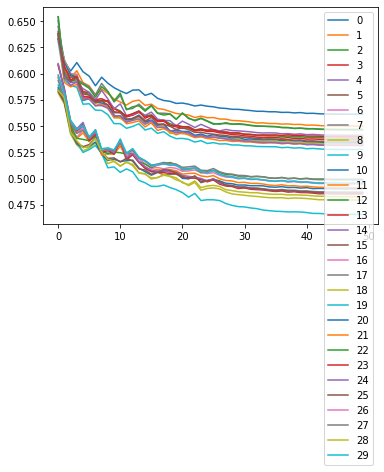

latents: [tensor([[[ 1.7957,  3.4385,  1.9668,  ...,  0.3445, -1.7482, -0.1760],
         [ 6.4321,  2.6255,  3.9224,  ...,  4.7374,  4.5793,  1.7699],
         [ 6.3161, -1.9522, -2.7515,  ...,  7.6040, -0.1000, -1.6731],
         ...,
         [ 0.9430, -3.1609,  5.5468,  ..., -0.9404, -1.1015, -0.9595],
         [ 0.7629,  1.4072,  3.5015,  ...,  1.3436,  0.2915,  2.5288],
         [ 2.2442,  2.4163,  1.1355,  ...,  0.6186, -0.0252,  0.5201]]],
       device='cuda:0', requires_grad=True), tensor([[[ 6.0529,  2.6929,  1.3933,  ...,  0.0310, -0.5328, -1.2475],
         [ 0.7512,  2.0131,  2.7274,  ..., -1.7013,  3.3095,  0.7423],
         [ 6.6029, -2.3474,  1.4211,  ...,  7.9749, -2.0851, -1.1194],
         ...,
         [-1.7389, -3.5957,  7.2421,  ..., -0.4305, -3.4839,  1.6788],
         [ 1.5105, -1.0130,  4.6113,  ...,  2.5145,  0.4864,  3.8093],
         [ 2.2547,  2.3834,  0.1194,  ...,  0.5038,  0.3064,  1.3412]]],
       device='cuda:0', requires_grad=True), tensor(0.5190), 

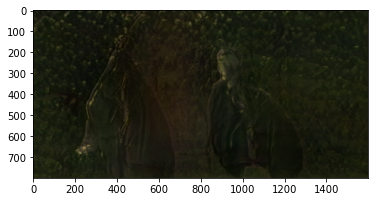

getting coefficient at k=3
interpolated point: 0.6628782153129578


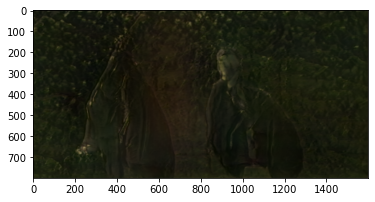

getting coefficient at k=4
interpolated point: 0.7632653713226318


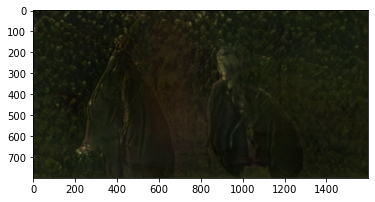

getting coefficient at k=5
interpolated point: 0.7735338807106018


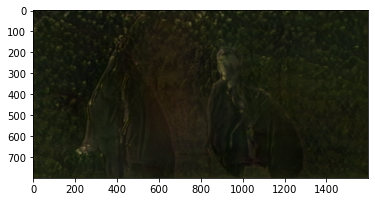

getting coefficient at k=6
interpolated point: 0.20265930891036987


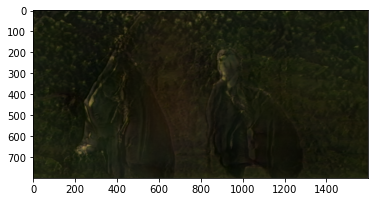

getting coefficient at k=7
interpolated point: 0.906960129737854


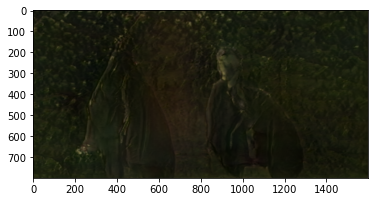

getting coefficient at k=8
interpolated point: 0.9324341416358948


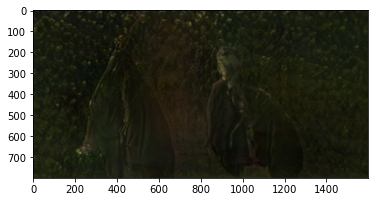

getting coefficient at k=9
interpolated point: 0.10746139287948608


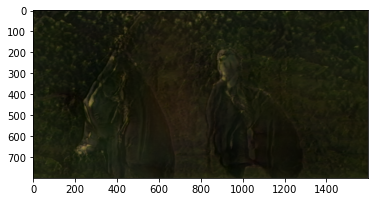

getting coefficient at k=10
interpolated point: 0.9763293266296387


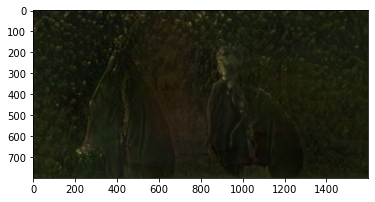

getting coefficient at k=11
interpolated point: 0.6616624593734741


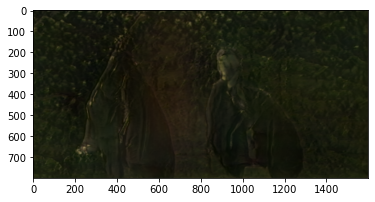

getting coefficient at k=12
interpolated point: 0.9685129523277283


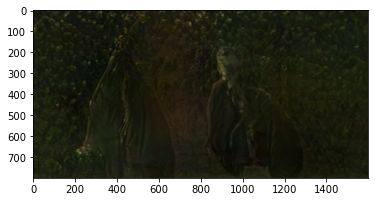

getting coefficient at k=13
interpolated point: 0.44689077138900757


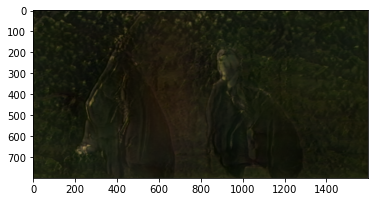

getting coefficient at k=14
interpolated point: 0.0939791202545166


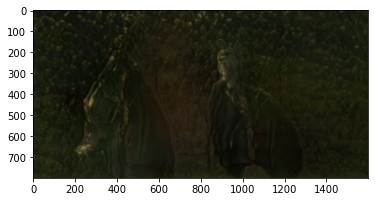

getting coefficient at k=15
interpolated point: 0.8828439712524414


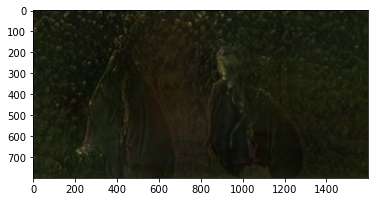

getting coefficient at k=16
interpolated point: 0.5782114267349243


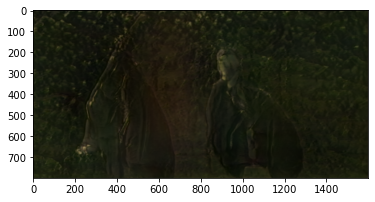

getting coefficient at k=17
interpolated point: 0.48895263671875


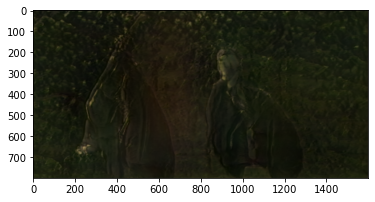

getting coefficient at k=18
interpolated point: 0.834208071231842


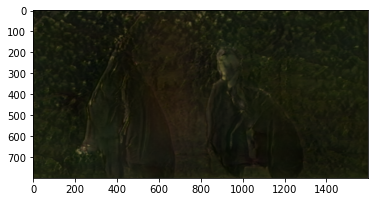

getting coefficient at k=19
interpolated point: 0.9885036945343018


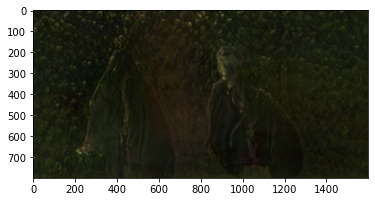

getting coefficient at k=20
interpolated point: 0.221391499042511


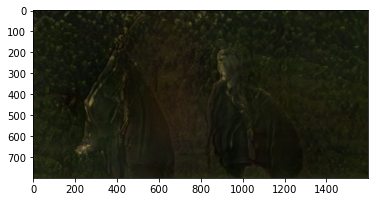

getting coefficient at k=21
interpolated point: 0.007791757583618164


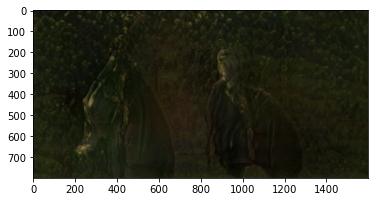

getting coefficient at k=22
interpolated point: 0.42310595512390137


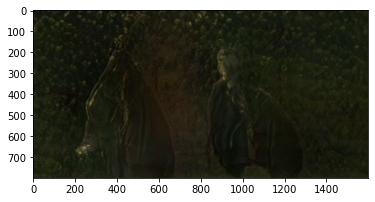

getting coefficient at k=23
interpolated point: 0.796635091304779


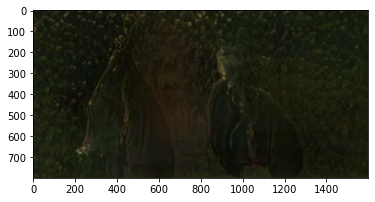

getting coefficient at k=24
interpolated point: 0.49434107542037964


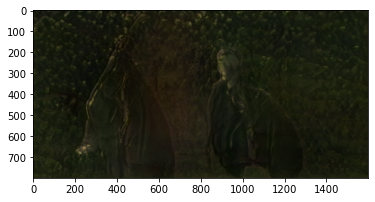

getting coefficient at k=25
interpolated point: 0.9773820042610168


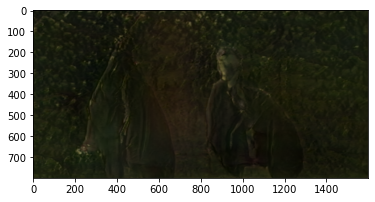

getting coefficient at k=26
interpolated point: 0.9920883178710938


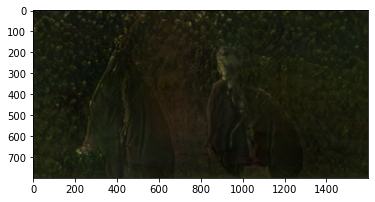

getting coefficient at k=27
interpolated point: 0.27101457118988037


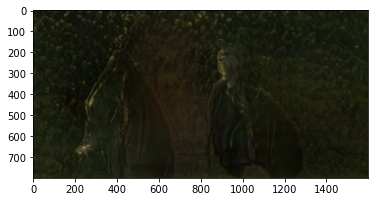

getting coefficient at k=28
interpolated point: 0.8009634613990784


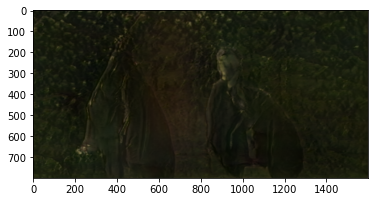

getting coefficient at k=29
interpolated point: 0.7567741870880127


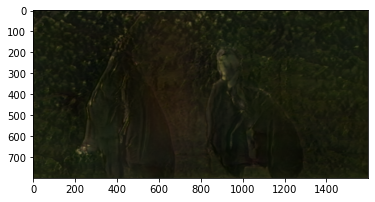

getting coefficient at k=30
interpolated point: 0.08239227533340454


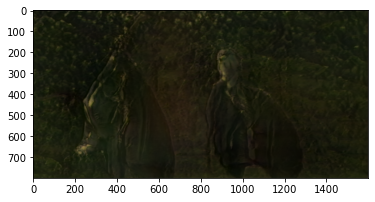

getting coefficient at k=31
interpolated point: 0.8659422993659973


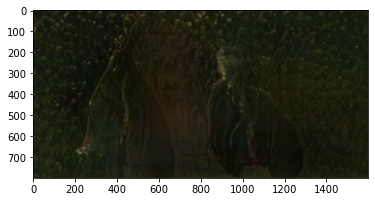

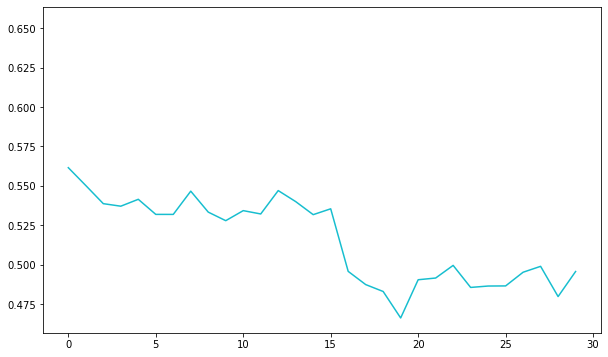

In [29]:
# look at lpips over time
data_filename = "/data/vision/torralba/scratch/vmreyes/" + \
                "interpolated-loss/lor_dialogue/window-30-peak-finding-frame-coefficients/video2/" + \
                ""+"lpips" + "-5000-steps.data"
with open(data_filename, 'rb') as datafile:
    data = pickle.load(datafile)

print(data.keys())
lpips = np.array(data['lpips'])
print(len(lpips[0])) # batch size, meaning we arent storing lpips for the whole slice
for i in range(len(lpips[0])):
    plt.plot(lpips[:,i], label=str(i))
plt.legend()
plt.show()

latents = data['latents'][-1]
print("latents:", latents)
print(len(latents))
target_frames = [0, 29]
final_frames = []
for j in range(0, len(target_frames), 2):
    latent_1_index = target_frames[j]
    latent_2_index = target_frames[j+1]
    print(f"(generating_final_frames) latent_1_index:{latent_1_index}, latent_2_index:{latent_2_index}")

    latent_1 = latents[j]
    latent_2 = latents[j+1]
    delta = latent_2 - latent_1
    print(f"delta:{delta}")

    num_frames = latent_2_index - latent_1_index
    for k in range(num_frames+1):
        print(f"getting coefficient at k={k+len(target_frames)}")
        interpolated_point = latents[k+len(target_frames)]
        print(f"interpolated point: {interpolated_point}")
        interpolated_latent = interpolated_point * delta + latent_1
        img_gen, _ = g_ema([interpolated_latent], input_is_latent=True, noise=noises) # make the images
        final_img_ar = make_image(img_gen)[0]
        final_img = Image.fromarray(final_img_ar).resize((frame_width,frame_height))
        plt.imshow(final_img)
        plt.show()



from celluloid import Camera
from IPython.display import HTML

#plot a slice of the lpips graph

fig, ax = plt.subplots(figsize=(10,6))
camera = Camera(fig)

for series_data in lpips:
    ax.plot(series_data)
    camera.snap()

animation = camera.animate()
HTML(animation.to_html5_video())

In [7]:
# look at lpips over time
data_filename = "/data/vision/torralba/scratch/vmreyes/" + \
                "interpolated-loss/lw-running-60-peak-finding-frame-coefficients/video/" + \
                ""+"lpips" + "-5000-steps.data"
latent_filename = "/data/vision/torralba/scratch/vmreyes/" + \
                "interpolated-loss/lw-running-60-peak-finding-frame-coefficients/latents/" + \
                ""+"lw-00275-5000-steps.pt"
with open(data_filename, 'rb') as datafile:
    data = pickle.load(datafile)
    latent_file = torch.load(latent_filename)

print(latent_file.keys())
print(data.keys())
lpips = np.array(data['lpips'])
print(len(lpips[0])) # batch size, meaning we arent storing lpips for the whole slice
for i in range(len(lpips[0])):
    plt.plot(lpips[:,i], label=str(i))
plt.legend()
plt.show()

latents = data['latents'][-1]
print("latents:", latents)
print(len(latents))
target_frames = [0, 29]
final_frames = []
for j in range(0, len(target_frames), 2):
    latent_1_index = target_frames[j]
    latent_2_index = target_frames[j+1]
    print(f"(generating_final_frames) latent_1_index:{latent_1_index}, latent_2_index:{latent_2_index}")

    latent_1 = latents[j]
    latent_2 = latents[j+1]
    delta = latent_2 - latent_1
    print(f"delta:{delta}")

    num_frames = latent_2_index - latent_1_index
    for k in range(num_frames+1):
        print(f"getting coefficient at k={k+len(target_frames)}")
        interpolated_point = latents[k+len(target_frames)]
        print(f"interpolated point: {interpolated_point}")
        interpolated_latent = interpolated_point * delta + latent_1
        img_gen, _ = g_ema([interpolated_latent], input_is_latent=True, noise=noises) # make the images
        final_img_ar = make_image(img_gen)[0]
        final_img = Image.fromarray(final_img_ar).resize((frame_width,frame_height))
        plt.imshow(final_img)
        plt.show()



from celluloid import Camera
from IPython.display import HTML

#plot a slice of the lpips graph

fig, ax = plt.subplots(figsize=(10,6))
camera = Camera(fig)

for series_data in lpips:
    ax.plot(series_data)
    camera.snap()

animation = camera.animate()
HTML(animation.to_html5_video())

KeyError: 'target_frames'